# Import Libraries

In [1]:
# # Import Libraries
# import matplotlib
# matplotlib.use('agg')
# from google.colab import drive
# drive.mount('/content/gdrive')
# sys.path.append('/content/gdrive/My Drive/Colab Notebooks')
# %load_ext line_profiler

import numpy as np
import pickle
import pandas as pd
import sys
import time
import random               # add some random sleep time
import scipy
import glob
import scipy.stats as stats
import time
import os
import math
import copy
import statsmodels.api as sm
import itertools
import re
import itertools
import shutil
# import h5py
import matplotlib
from scipy.io import arff

from os import listdir

# from spot import SPOT
from os.path import isfile, join
# from statsutils import *
# from boltons.statsutils import *
from datetime import datetime
from itertools import repeat, cycle, islice
# from ipywidgets import interact
from dateutil.parser import parse

from sklearn.preprocessing import normalize, StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.utils import check_random_state, shuffle
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.svm import OneClassSVM as ocsvm
from sklearn import cluster, datasets, metrics, mixture, svm
from sklearn.neighbors import KNeighborsClassifier, LocalOutlierFactor, kneighbors_graph
from sklearn.model_selection import train_test_split
# from imblearn.over_sampling import RandomOverSampler


from scipy import linalg
from scipy.special import gamma, factorial, digamma, betaln, gammaln
from scipy.stats import beta, multivariate_normal, wishart, invwishart, t, mode
from scipy.stats import genextreme as gev
import scipy.spatial as sp
import scipy.io
from scipy.io import arff

from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
import plotly.graph_objs as go
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import matplotlib.pylab as pylab
import matplotlib as mpl

sns.set(color_codes=True)
sns.set_style("whitegrid")
sns.set_context("paper", font_scale=2)
%config InlineBackend.print_figure_kwargs = {'bbox_inches': None}
%matplotlib inline

# Global Figure Parameters
global label_size
global fig_len
global fig_wid
global m_size
global title_size

fig_len = 16
fig_wid = 16
m_size = 50
title_size = 50
label_size = 30

plot_params = {'legend.fontsize': 60,
               'figure.figsize': (fig_len, fig_wid),
               'axes.labelsize': label_size,
               'axes.titlesize': title_size,
               'xtick.labelsize': label_size,
               'ytick.labelsize': label_size}
pylab.rcParams.update(plot_params)


In [2]:
import sys
from pathlib import Path
sys.path.insert(0, str((Path.cwd() / '..').resolve()))


In [3]:
from lib.core import *
from lib.lad_functions import *
from lib.import_functions import *
import glob
from tqdm import tqdm


In [4]:
data_path = '../Data/'
os.getcwd()
Path.cwd()


PosixPath('/Users/otg/Documents/GitHub/pattern-of-life/notebooks')

# PoL

In [5]:
data = pickle.load(open(data_path+'df_motion_sensor_matrix.pkl', 'rb'))
data['Timestamp'] = pd.to_datetime(data.index, unit='s')

ts = data['Timestamp']
data['Year'] = ts.dt.year
data['Month'] = ts.dt.month
data['Week'] = ts.dt.isocalendar().week
data['Day'] = ts.dt.day
data['Hour'] = ts.dt.hour
data['Min'] = ts.dt.minute
data['15_Min'] = (np.floor(data['Min']/15))
# data['15_Min'] = str(data['Timestamp'].dt.year)+ str(data['Timestamp'].dt.month)+ str(data['Timestamp'].dt.day)+ str(data['Timestamp'].dt.hour)+str(np.floor(data['Min']/15))

# Subsetting data to one month
# data = data[data['Month'] == 9]
# data['Day_of_week'] =  data['Timestamp'].apply(lambda x: parse(str(x)).strftime("%A"))

data.head()


,M046,M048,M050,M044,M047,M045,M034,M049,M043,M029,...,M012,M011,Timestamp,Year,Month,Week,Day,Hour,Min,15_Min
1251086400,False,False,False,False,False,False,False,False,False,False,...,False,False,2009-08-24 04:00:00,2009,8,35,24,4,0,0.0
1251086401,False,False,False,False,False,False,False,False,False,False,...,False,False,2009-08-24 04:00:01,2009,8,35,24,4,0,0.0
1251086402,False,False,False,False,False,False,False,False,False,False,...,False,False,2009-08-24 04:00:02,2009,8,35,24,4,0,0.0
1251086403,False,False,False,False,False,False,False,False,False,False,...,False,False,2009-08-24 04:00:03,2009,8,35,24,4,0,0.0
1251086404,False,False,False,False,False,False,False,False,False,False,...,False,False,2009-08-24 04:00:04,2009,8,35,24,4,0,0.0


In [6]:
sensor_id = data.columns[:-8]
# temp_res = '15_Min'
d2 = data.groupby(by=['Year', 'Month', 'Week', 'Day',
                  'Hour', '15_Min']).sum()[sensor_id]
                #   .reset_index()
# d2.head()

In [7]:
# d2.iloc[20*4:-3*4]

In [14]:
import glob
from tqdm import tqdm

from lib.core import *
from lib.lad_functions import *
from lib.import_functions import *
import glob
from tqdm import tqdm


sensor_id = 'M046'
temp_res = '15_Min'

K = 25
reg_covar = 1e-10
covariance_type = 'full'
th = 0.15
start_time_step = 10
numiter = 10
cluster_train = 0.25

# dates=pd.DatetimeIndex(data_deaths3.columns)
# d2 = np.array(sensor_ts(sensor_id, data, temp_res))[:, np.newaxis]

# All sensors, all days
X_full = d2.iloc[20*4:-3*4].values.reshape(250,
                                      24*4, 51).transpose(0, 2, 1).astype(float)


history_time = 100
output = ldp_ts_non_uniform(X_full, K, th, start_time_step,
                            history_time, numiter)
# pickle.dump( output, open("Test_output.pickle", "wb" ))

Active clusters = 25, Time-step = 10,         Clusters = [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25], Cluster Sizes =[ 1  6 11 11 76 17  1 17  2  9  2  1  2  5  2  2 11  2  2  5 10  3  1 48
  3]:   0%|          | 0/86 [00:00<?, ?it/s]/Users/otg/Documents/GitHub/pattern-of-life/lib/lad_functions.py:296: RuntimeWarning: divide by zero encountered in divide
  ss = [1/(cov) for cov in covariances]
/Users/otg/Documents/GitHub/pattern-of-life/lib/lad_functions.py:348: RuntimeWarning: invalid value encountered in divide
  ana_score = (ana_score-np.min(ana_score)) / \
Active clusters = 25, Time-step = 10,         Clusters = [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25], Cluster Sizes =[ 1  6 11 11 76 17  1 17  2  9  2  1  2  5  2  2 11  2  2  5 10  3  1 48
Active clusters = 6, Time-step = 26,         Clusters = [-4. -3. -2. -1.  5.], Cluster Sizes =[  1   1   1   1 246]:  19%|█▊        | 16/86 [00:14<01:03,  1.10it/s]           

KeyboardInterrupt: 

# Tests

In [16]:
def test(X_full, z, start_time_step, d):
    K_f=len(np.unique(np.abs(z[start_time_step])))
    assert X_full.shape[0] == lad_z_initialization(X_full, K_f).shape[0]
    assert len(z[start_time_step-1].shape) == 1
    n, f, t = X_full[:, :, :d].shape
    assert n,f*t == cleaned_windowed_tsdb(
        X_full, history_time, start_time_step, d)[0].shape

test(X_full, output['z'], start_time_step,5)

# Visualization

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

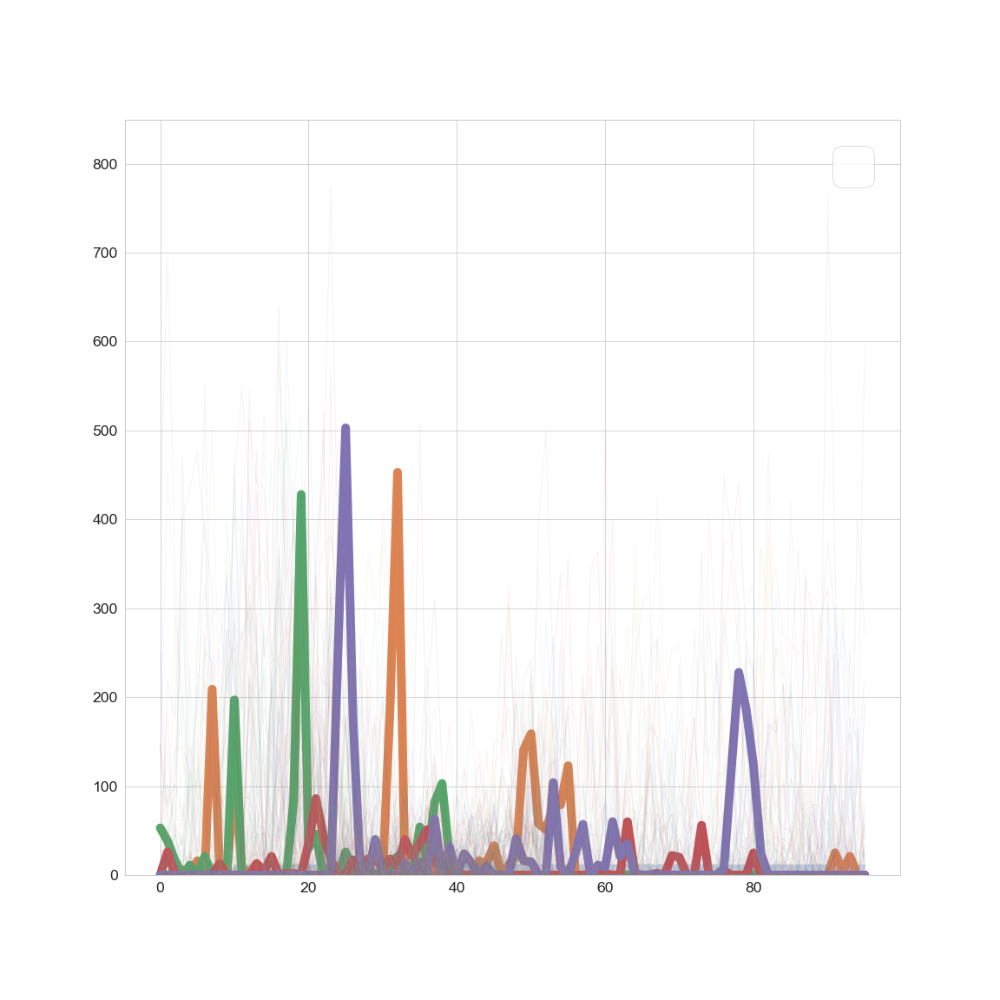

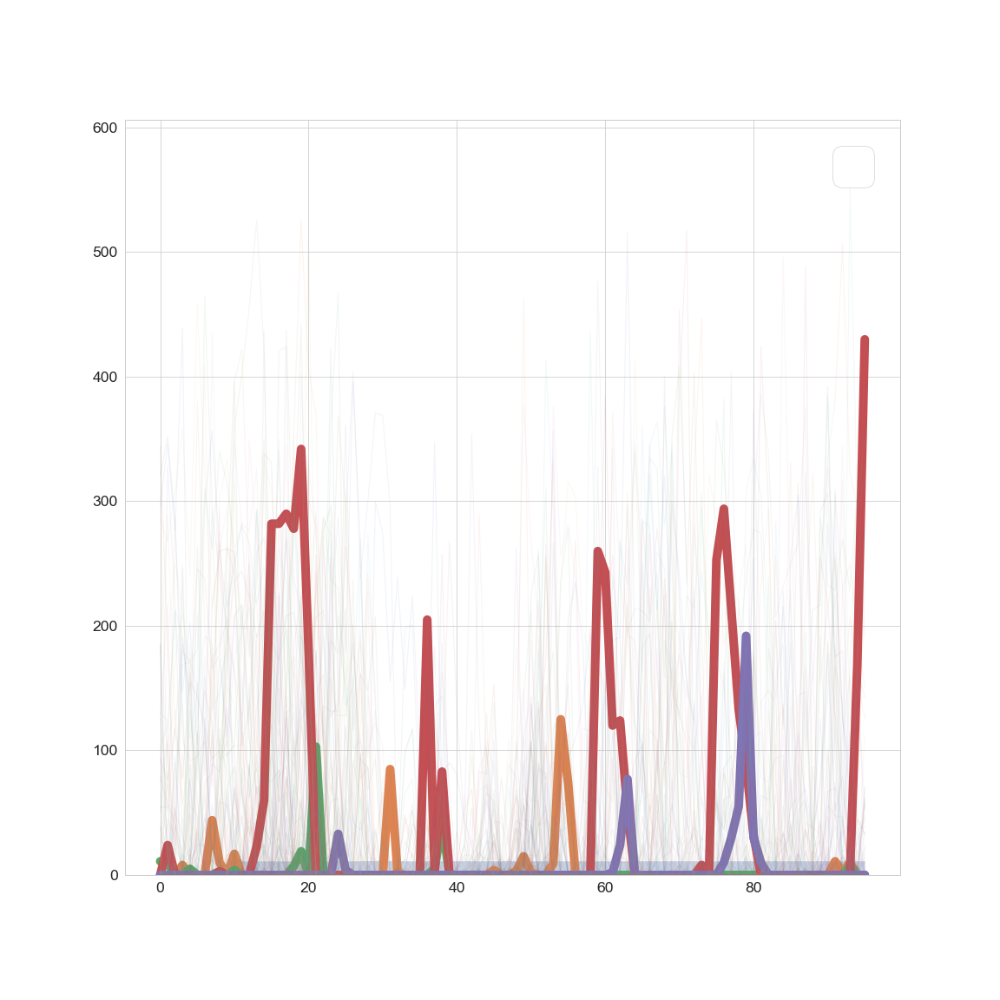

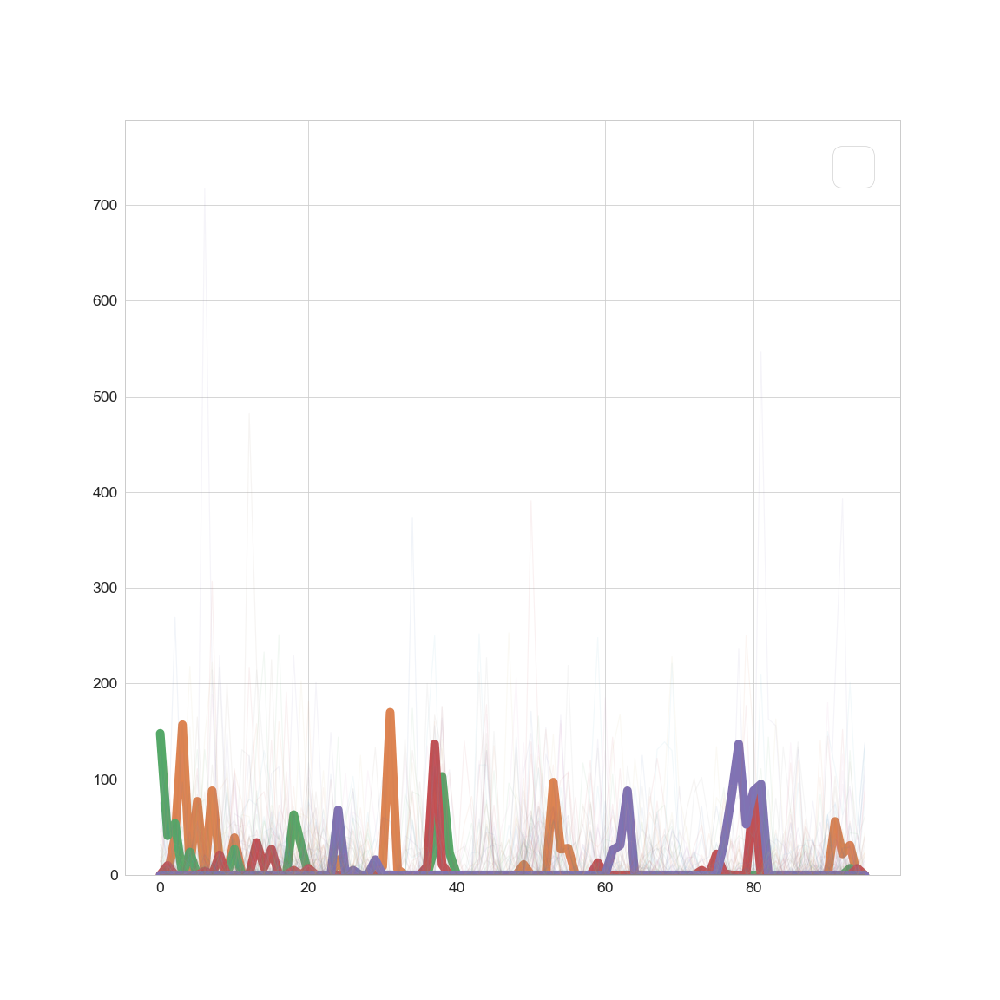

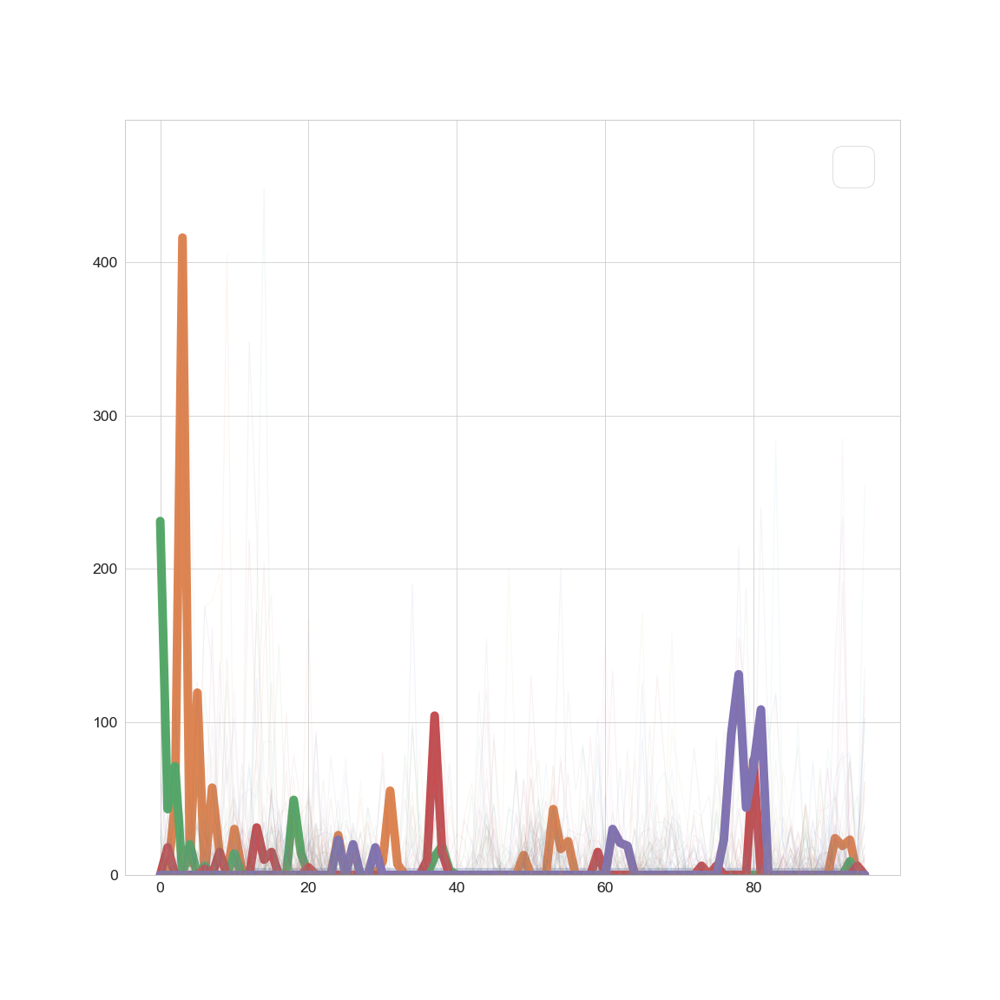

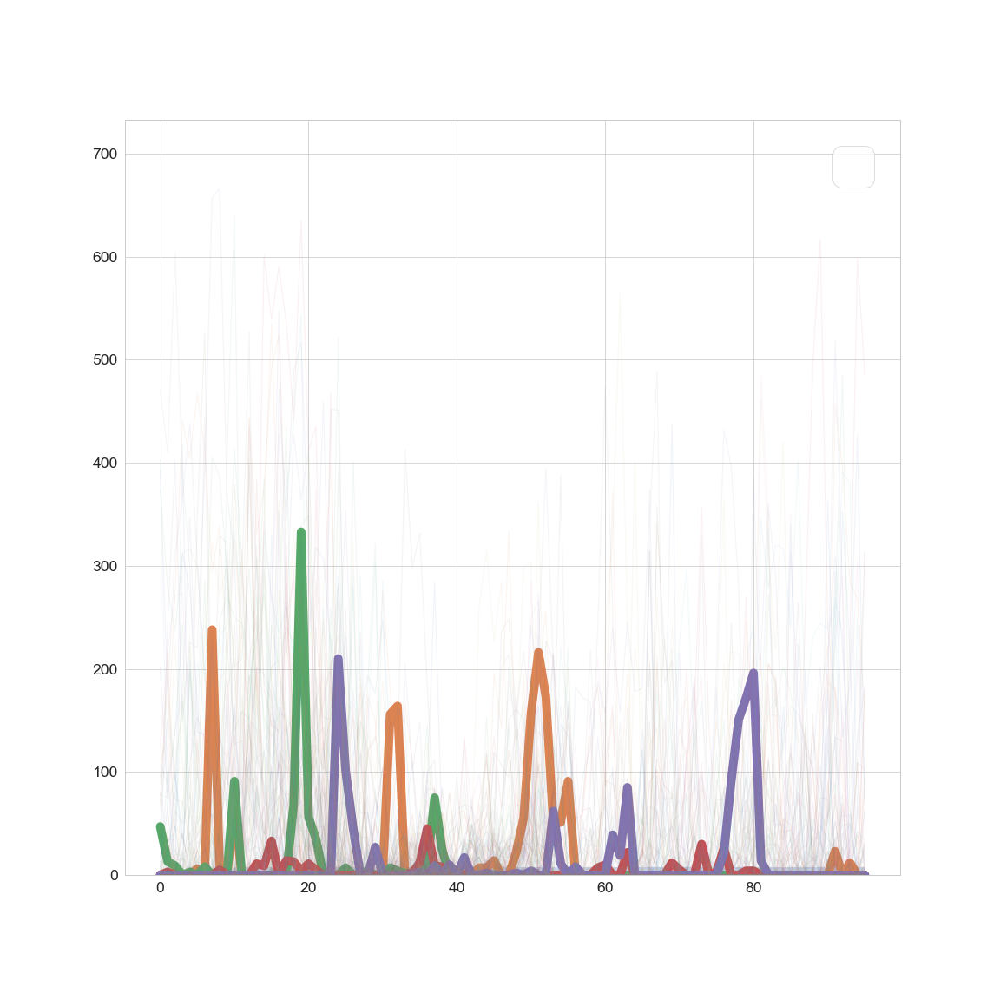

...

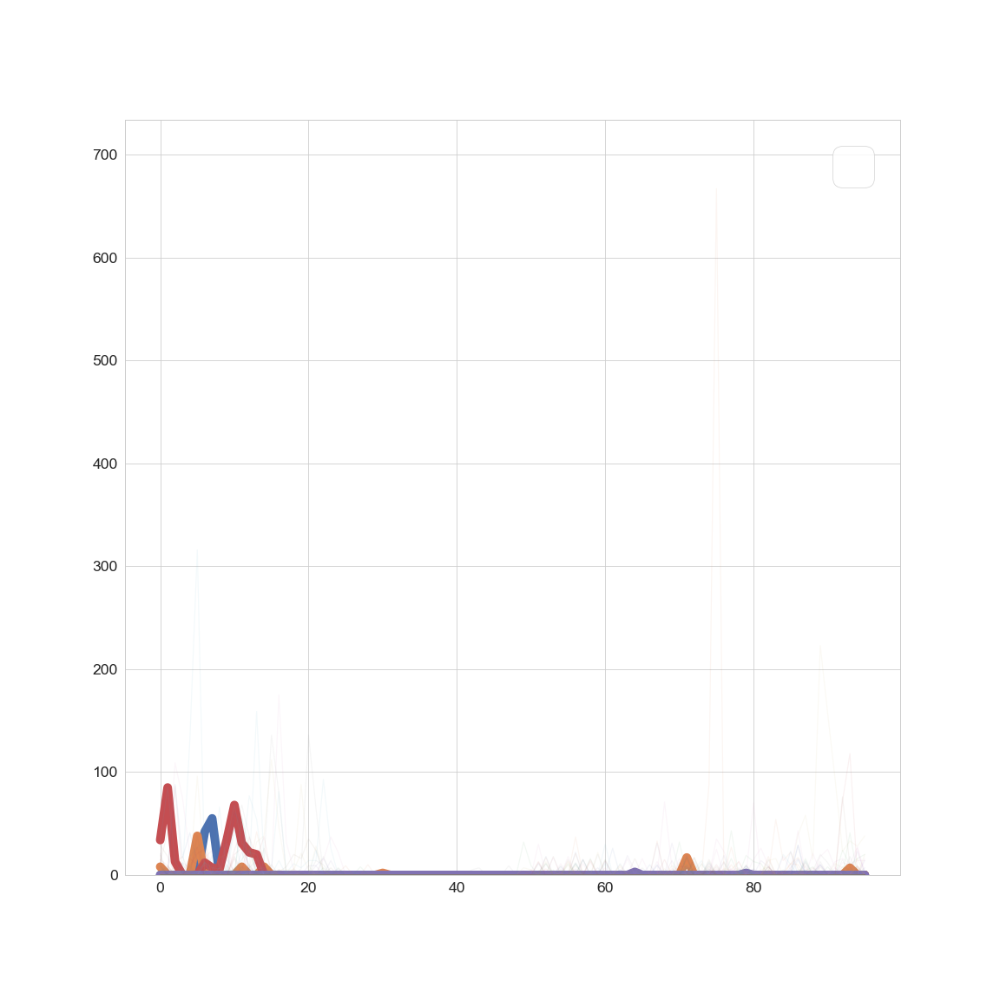

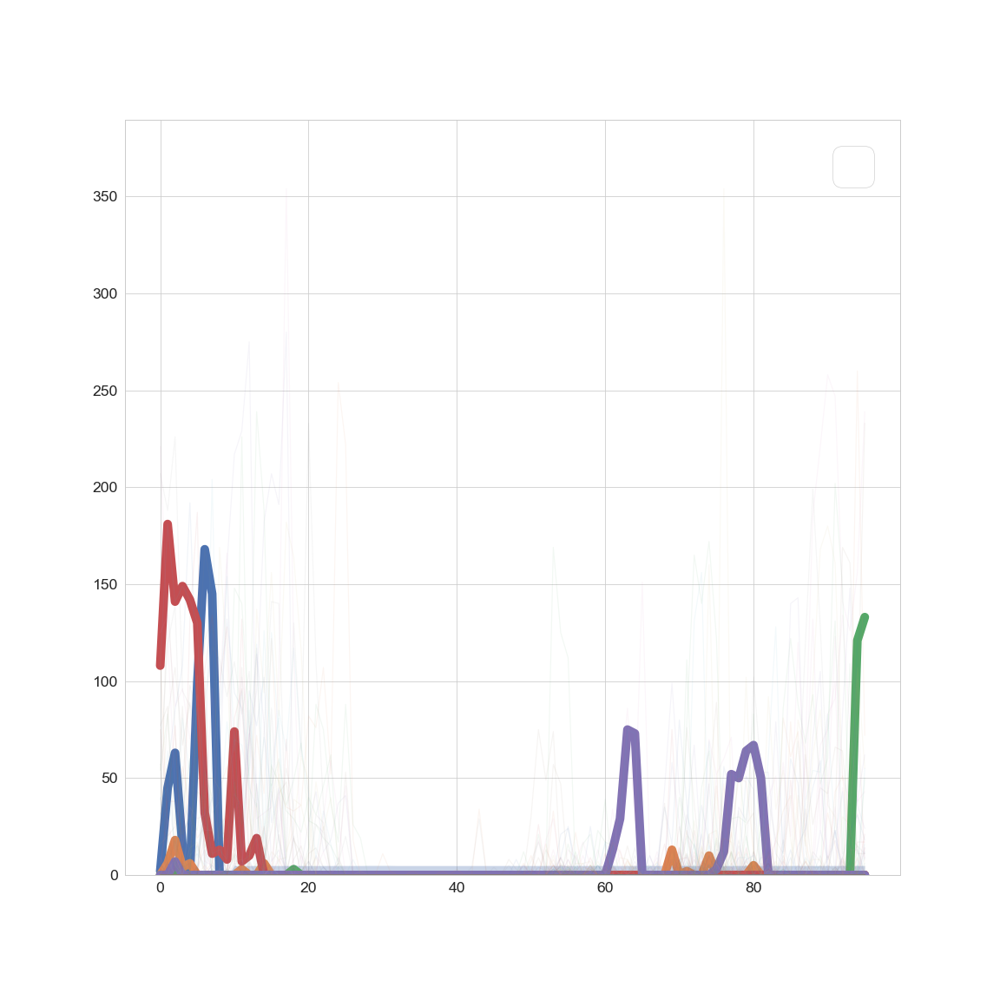

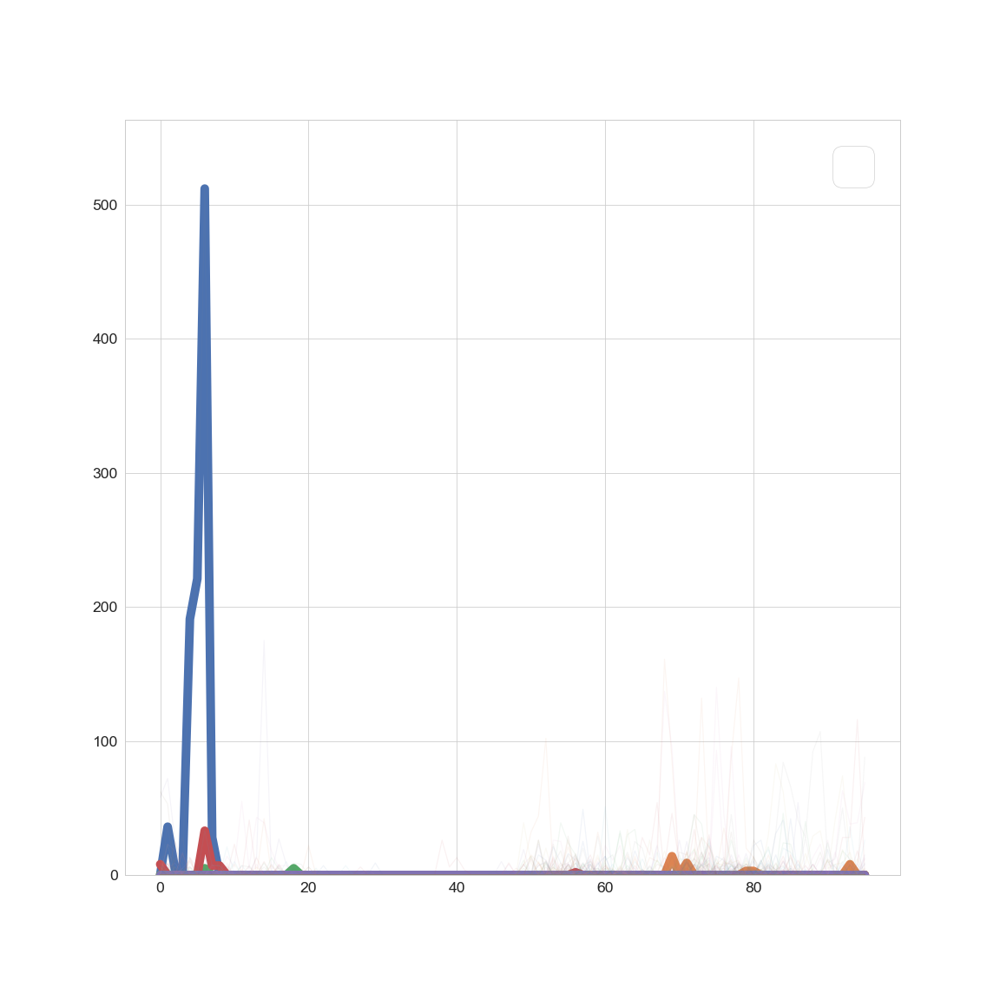

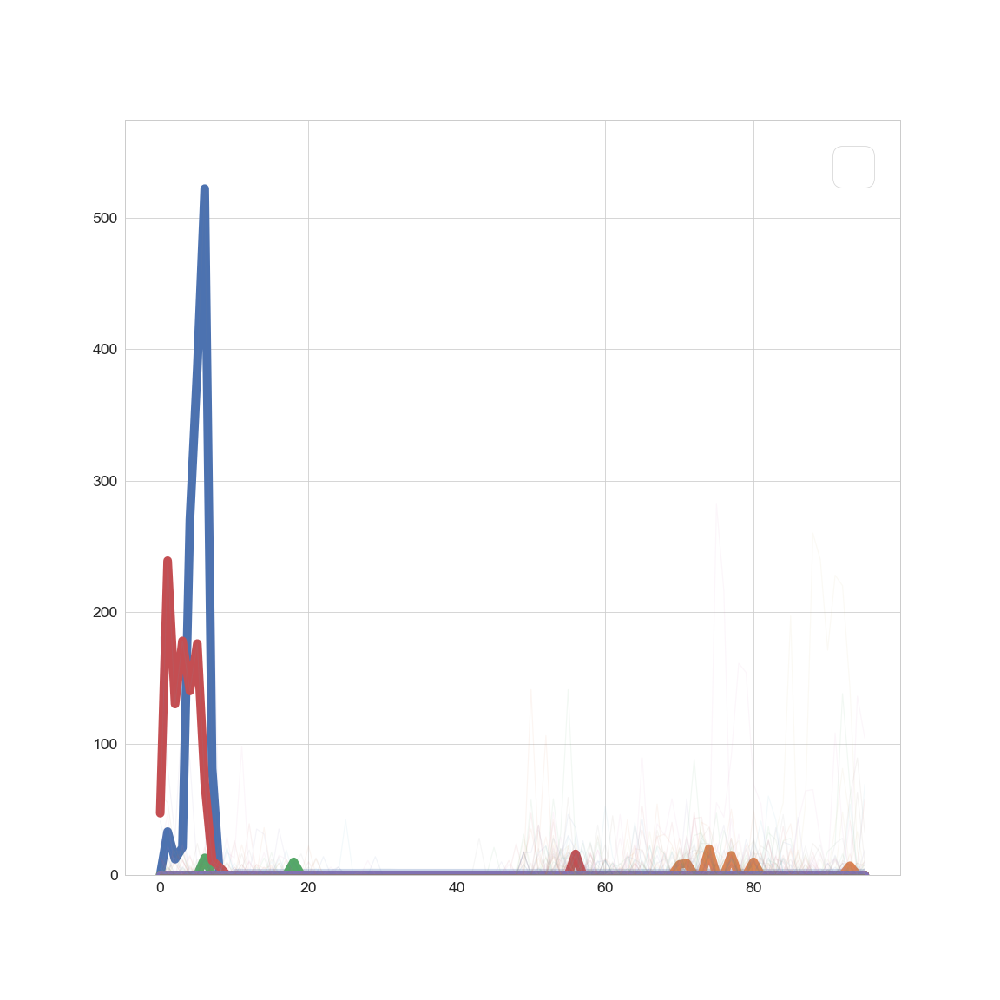

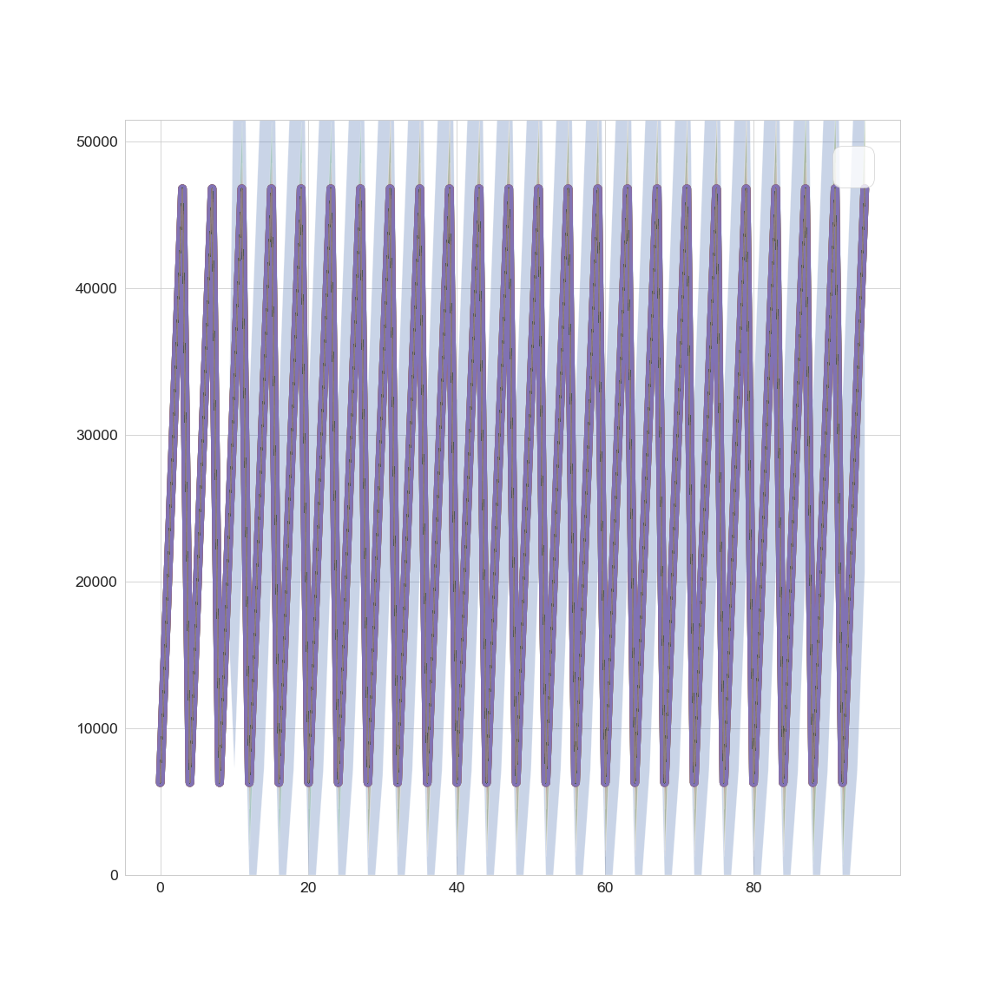

In [ ]:
z = output['z']
ana_prob_array_0 = np.copy(output['ana_prob_array'])
ana_prob_array = np.copy(ana_prob_array_0)
N, D = ana_prob_array_0.shape

z_full = np.ones((N, D))
for d in z.keys():
    z_full[:, d] = z[d]
z_full[z_full == 1] = 0
z_full *= -1

sorted_counties = np.argsort(-np.nanmean(z_full, axis=1))
ana_ts = sorted_counties[:5]
normal_ts = sorted_counties[:]

dates = np.arange((X_plot.shape[-1]))
for f_dim in range(X_full.shape[1]):
    X_plot = X_full[:, f_dim, :]
    X_f = np.copy(X_plot)


    fig, (ax3) = plt.subplots(1, 1)
    X_f[np.isnan(X_f)] = 0
    inds = sorted_counties[:5]
    #     factor=1
    factor = np.mean(X_f[inds])/np.max(ana_prob_array_0[inds])

    ymax = np.max(np.max(X_plot))
    ax3.set_ylim([0, ymax*1.1])

    for i in inds:
        x, y = dates, np.array(X_plot[i])

        probs = np.copy(ana_prob_array_0[i, :])

        y_upper, y_lower = y+probs*factor, y-probs*factor
        y_lower[y_lower < 0] = 0

        ax3.plot(dates, y, linewidth=10)
        ax3.fill_between(dates, y_lower, y_upper,
                        alpha=0.3
                        )

    ax3.legend(ncol=5, prop={'size': 60})
    pd.DataFrame(X_plot).T.set_index(
        dates).plot(alpha=0.075, legend=None, ax=ax3)
    # ax3.set_ylabel(ylabel)
    # plt.savefig(image_path+prefix+'_top_10_per_capita.png')
    # plt.close('all')


In [41]:
sensor_coordinates_loc='../Data/coordinates_motion_sensos_kyoto.xlsx'
sensor_loc=pd.read_excel(sensor_coordinates_loc)
sensor_loc=sensor_loc.set_index('motion_sensor_id')
sensor_loc.head()


,X,Y
motion_sensor_id,,
M001,1081,583
M002,949,441
M003,943,275
M004,952,109
M005,1129,115


In [66]:
tuple(sensor_loc.loc['M002'])

(949, 441)

In [52]:
sensor_id = data.columns[:-8]


In [78]:
X_full[0].shape

(51, 96)

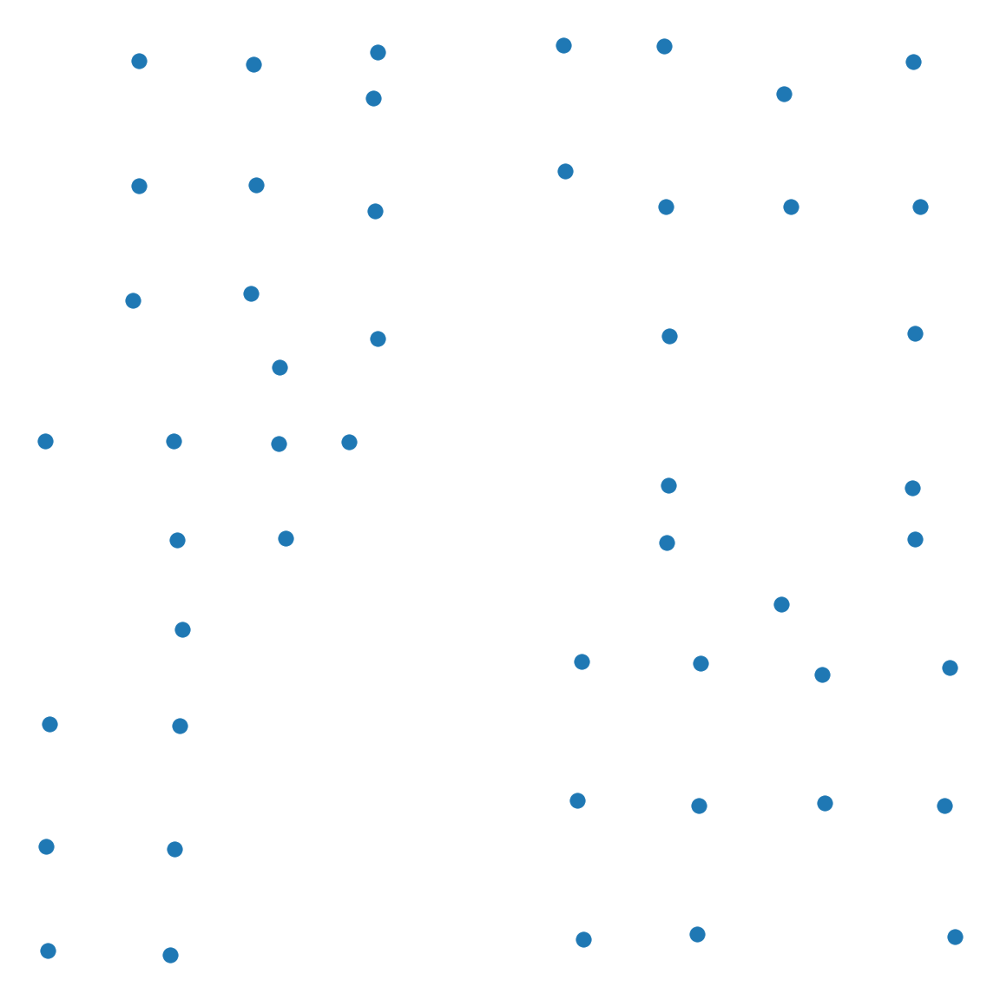

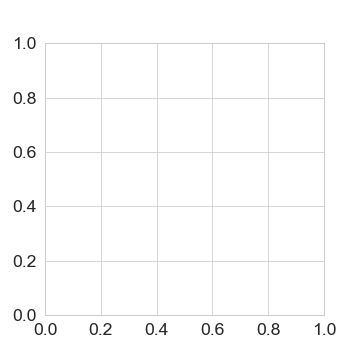

In [83]:
import networkx as nx
import matplotlib.animation
G = nx.Graph()
for i, s in enumerate(sensor_id[:-1]):
    G.add_node(s, pos=tuple(sensor_loc.loc[s]) )

d = dict(G.degree)
pos = nx.get_node_attributes(G, 'pos')
nx.draw(G,pos)

fig, ax = plt.subplots(figsize=(5,5))

def update(num):
    ax.clear()
    i = num//2
    if i==0:
        nx.draw(G,pos, node_color='green')
    else:
        nx.draw(G,pos, node_color='red')


ani = matplotlib.animation.FuncAnimation(
    fig, update, frames=6, interval=1000, repeat=True)
plt.show()


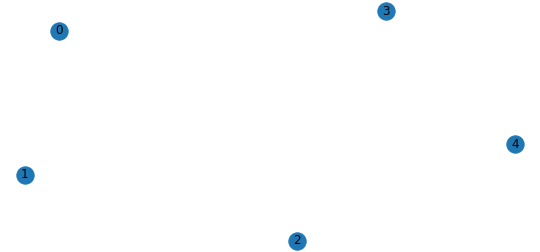

In [7]:
from matplotlib import pyplot as plt, animation
import networkx as nx
import random

# plt.rcParams["figure.figsize"] = [7.50, 3.50]
# plt.rcParams["figure.autolayout"] = True

fig = plt.figure()

G = nx.DiGraph()
G.add_nodes_from([0, 1, 2, 3, 4])

nx.draw(G, with_labels=True)


def animate(frame):
   fig.clear()
   num1 = random.randint(0, 4)
   num2 = random.randint(0, 4)
   G.add_edges_from([(num1, num2)])
   nx.draw(G, with_labels=True)


ani = animation.FuncAnimation(
    fig, animate, frames=6, interval=1000, repeat=True)

plt.show()


In [1]:
# Enable interactive plot
import matplotlib.pyplot as plt
%matplotlib notebook
import numpy as np

from matplotlib.animation import FuncAnimation


In [2]:
fig, ax = plt.subplots()
line, = ax.plot([])     # A tuple unpacking to unpack the only plot
ax.set_xlim(0, 2*np.pi)
ax.set_ylim(-1.1, 1.1)


def animate(frame_num):
    y = np.sin(x + 2*np.pi * frame_num/100)
    line.set_data((x, y))
    return line


anim = FuncAnimation(fig, animate, frames=100, interval=20)
plt.show()


<IPython.core.display.Javascript object>

In [3]:
fig, ax = plt.subplots()
xdata, ydata = [], []
ln, = ax.plot([], [], 'ro')

def init():
    ax.set_xlim(0, 2*np.pi)
    ax.set_ylim(-1, 1)
    return ln,

def update(frame):
    xdata.append(frame)
    ydata.append(np.sin(frame))
    ln.set_data(xdata, ydata)
    return ln,

ani = FuncAnimation(fig, update, frames=np.linspace(0, 2*np.pi, 128), init_func=init, blit=True)

plt.show()

<IPython.core.display.Javascript object>

/opt/homebrew/Caskroom/miniconda/base/envs/lakes/lib/python3.10/site-packages/matplotlib/animation.py:887: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you have outputted the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


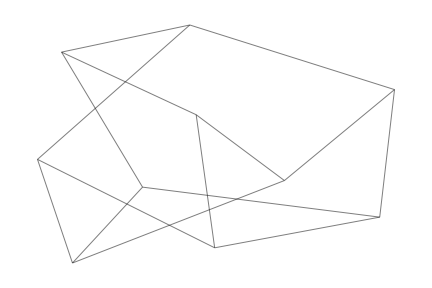

In [5]:
from functools import partial
import matplotlib.animation
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
# %matplotlib notebook
%config InlineBackend.print_figure_kwargs = {'bbox_inches': None}
%matplotlib inline


def update(i, G, pos, t, ax):
    #fig.clf()
    cmap = matplotlib.cm.get_cmap('Blues')
    color_map = []
    for node in G:
        color_map.append(cmap(t[i]))

    nx.draw_networkx_nodes(G, pos, node_color=color_map, ax=ax)


t = np.linspace(0, 1, 10)
G = nx.petersen_graph()
pos = nx.spring_layout(G)  # positions for all nodes

fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])
#fig.add_axes(rect,label=label1)
plt.axis('off')

upd = partial(update, G=G, pos=pos, t=t, ax=ax)
# nodelist=[0,1,2,3], #node_color='r', #node_size=500,
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5, ax=ax)

ani = matplotlib.animation.FuncAnimation(
    fig, upd, repeat=True, interval=100, frames=len(t), repeat_delay=10)
plt.show()
